# PHASE: 1

In [8]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/muhammadhassan82/electric-damaged/electric damaged.jpg
/kaggle/input/datasets/muhammadhassan82/dusty-panel/dusty.jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (63).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (73).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (83).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (61).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (55).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (94).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (113).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (67).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (53).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (34).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow

 PHASE 1 - DATA PREPARATION

In [9]:


# This script covers all steps required to prepare the solar panel image dataset for model training.
# - Step 1: Verifies the initial dataset structure and image counts for JPG, JPEG, and PNG files.
# - Step 2: Implements a preprocessing pipeline (Resize, CLAHE, Denoise).
# - Step 3: Quantifies preprocessing impact using PSNR and SSIM metrics.
# - Step 4: Splits the data into training, validation, and testing sets (80/10/10).
# - Step 5: Applies data augmentation to the training set to create a balanced
#           dataset with 1000 images per class.
# - Step 6: Includes comprehensive visualizations for each major step.


## 1. IMPORTS

In [10]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import shutil
from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import warnings

# Suppress minor warnings
warnings.filterwarnings("ignore")
print("Libraries imported successfully.")

Libraries imported successfully.


## 2. DATASET VERIFICATION AND VISUALIZATION

In [11]:

try:
    dataset_path = '/kaggle/input/solar-panel-images/Faulty_solar_panel'
    if not os.path.exists(dataset_path):
         raise FileNotFoundError
except FileNotFoundError:
    print("Kaggle dataset path not found. Please ensure your dataset is in the correct directory.")
    # As a fallback for local execution, you might set it like this:
    # dataset_path = './Faulty_solar_panel'
    # For now, creating a dummy structure to allow the script to run.
    if not os.path.exists('./Faulty_solar_panel'):
        os.makedirs('./Faulty_solar_panel', exist_ok=True)
        dummy_classes = ['Clean', 'Dusty', 'Bird-drop', 'Electrical-damage', 'Physical-Damage', 'Snow-Covered']
        for cls in dummy_classes:
            os.makedirs(os.path.join('./Faulty_solar_panel', cls), exist_ok=True)
        print("Created dummy dataset directories for script execution.")
    dataset_path = './Faulty_solar_panel'


print(f"Dataset path set to: {dataset_path}")


Dataset path set to: /kaggle/input/solar-panel-images/Faulty_solar_panel


### --- Get all image files (jpg, jpeg, png) ---

In [12]:

def get_image_files(path):
    return glob.glob(os.path.join(path, "*.jpg")) + \
           glob.glob(os.path.join(path, "*.jpeg")) + \
           glob.glob(os.path.join(path, "*.png"))

### --- Count images in each class ---

In [13]:

print("\nVerifying initial image counts per class:")
classes = sorted([d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))])
for cls in classes:
    class_path = os.path.join(dataset_path, cls)
    image_files = get_image_files(class_path)
    print(f"- {cls}: {len(image_files)} images")


Verifying initial image counts per class:
- Bird-drop: 171 images
- Clean: 185 images
- Dusty: 190 images
- Electrical-damage: 90 images
- Physical-Damage: 66 images
- Snow-Covered: 105 images


### --- Visualize a few sample images ---


Visualizing random samples from each class...


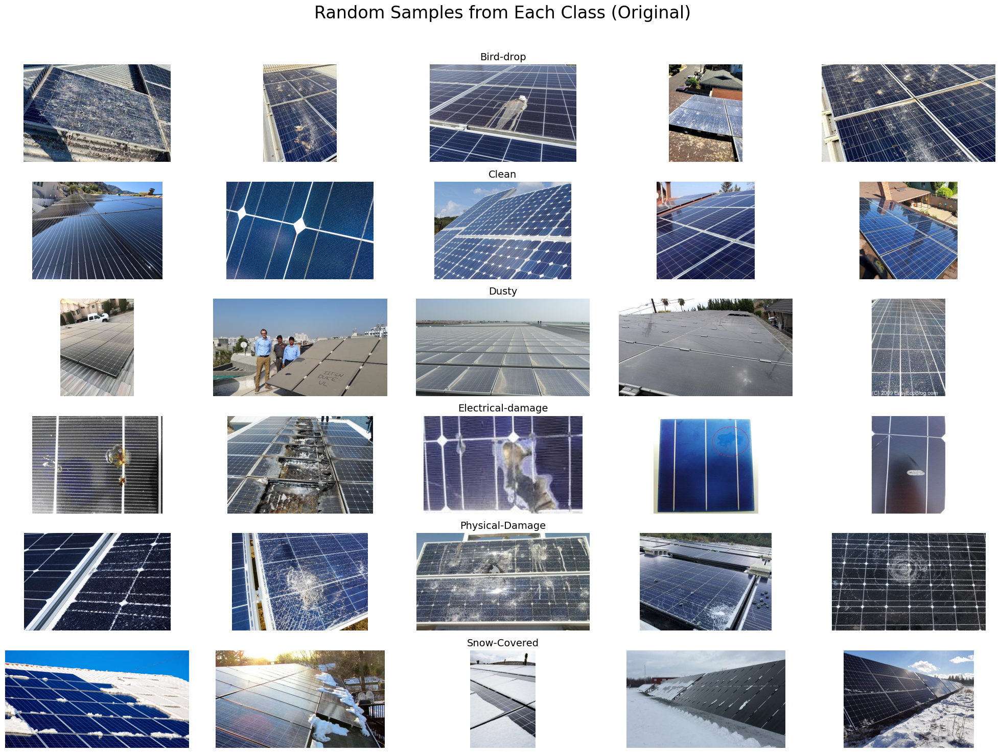

In [14]:

print("\nVisualizing random samples from each class...")
fig, axes = plt.subplots(len(classes), 5, figsize=(20, 15))
fig.suptitle('Random Samples from Each Class (Original)', fontsize=24)

for i, cls in enumerate(classes):
    class_path = os.path.join(dataset_path, cls)
    image_files = get_image_files(class_path)
    if image_files:
        sample_files = random.sample(image_files, min(5, len(image_files)))
        for j, img_path in enumerate(sample_files):
            try:
                img = plt.imread(img_path)
                axes[i, j].imshow(img)
                axes[i, j].axis("off")
                if j == 2: # Center column for title
                    axes[i, j].set_title(cls, fontsize=14)
            except Exception as e:
                axes[i, j].text(0.5, 0.5, 'Error', ha='center')
                axes[i, j].axis("off")
                print(f"Could not read {img_path}: {e}")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


## 3. IMAGE PREPROCESSING PIPELINE

In [15]:

print("\nStarting image preprocessing pipeline...")
output_dir = "/kaggle/working/preprocessed_dataset"
os.makedirs(output_dir, exist_ok=True)

IMG_SIZE = (224, 224)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
preprocessing_examples = {}

for cls in tqdm(classes, desc="Preprocessing classes"):
    class_input_path = os.path.join(dataset_path, cls)
    class_output_path = os.path.join(output_dir, cls)
    os.makedirs(class_output_path, exist_ok=True)

    image_files = get_image_files(class_input_path)
    if image_files:
        preprocessing_examples[cls] = image_files[0]

    for img_path in image_files:
        try:
            img = cv2.imread(img_path)
            if img is None: continue

            # Pipeline steps
            img_resized = cv2.resize(img, IMG_SIZE)
            yuv = cv2.cvtColor(img_resized, cv2.COLOR_BGR2YUV)
            yuv[:, :, 0] = clahe.apply(yuv[:, :, 0])
            img_clahe = cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)
            img_denoised = cv2.fastNlMeansDenoisingColored(img_clahe, None, h=10, hColor=10, templateWindowSize=7, searchWindowSize=21)
            
            # Save preprocessed image as JPG for consistency
            file_name = os.path.splitext(os.path.basename(img_path))[0] + '.jpg'
            cv2.imwrite(os.path.join(class_output_path, file_name), img_denoised)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

print(f"\nAll images preprocessed and saved in: {output_dir}")


Starting image preprocessing pipeline...


Preprocessing classes: 100%|██████████| 6/6 [02:17<00:00, 22.91s/it]


All images preprocessed and saved in: /kaggle/working/preprocessed_dataset


## 3.1. PREPROCESSING VISUALIZATION AND METRICS


Calculating PSNR/SSIM and visualizing preprocessing steps...
- Bird-drop: PSNR = 21.61, SSIM = 0.8337
- Clean: PSNR = 20.92, SSIM = 0.8370
- Dusty: PSNR = 19.63, SSIM = 0.8479
- Electrical-damage: PSNR = 25.24, SSIM = 0.8769
- Physical-Damage: PSNR = 20.62, SSIM = 0.8668
- Snow-Covered: PSNR = 22.17, SSIM = 0.8539


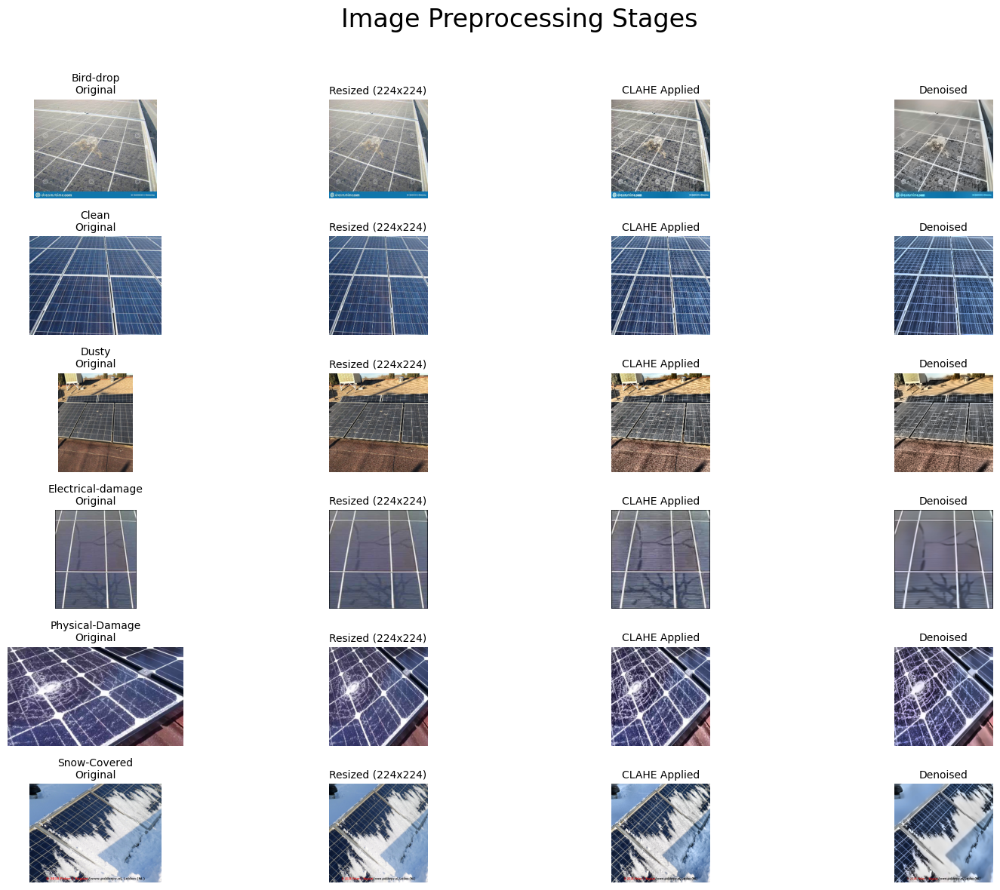

In [16]:

print("\nCalculating PSNR/SSIM and visualizing preprocessing steps...")
fig, axes = plt.subplots(len(classes), 4, figsize=(16, 12))
fig.suptitle('Image Preprocessing Stages', fontsize=24)

for i, cls in enumerate(classes):
    img_path = preprocessing_examples.get(cls)
    if not img_path: continue
    
    original_img = cv2.imread(img_path)
    
    # --- Apply steps for visualization ---
    img_resized = cv2.resize(original_img, IMG_SIZE)
    yuv = cv2.cvtColor(img_resized, cv2.COLOR_BGR2YUV)
    yuv[:, :, 0] = clahe.apply(yuv[:, :, 0])
    img_clahe = cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)
    img_denoised = cv2.fastNlMeansDenoisingColored(img_clahe, None, h=10, hColor=10, templateWindowSize=7, searchWindowSize=21)

    # Calculate metrics against the resized image
    psnr_val = psnr(img_resized, img_denoised, data_range=255)
    ssim_val = ssim(img_resized, img_denoised, channel_axis=-1, data_range=255, win_size=7)
    print(f"- {cls}: PSNR = {psnr_val:.2f}, SSIM = {ssim_val:.4f}")
    
    # --- Plotting ---
    axes[i, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title(f"{cls}\nOriginal", fontsize=10)
    axes[i, 0].axis('off')

    axes[i, 1].imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title("Resized (224x224)", fontsize=10)
    axes[i, 1].axis('off')

    axes[i, 2].imshow(cv2.cvtColor(img_clahe, cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title("CLAHE Applied", fontsize=10)
    axes[i, 2].axis('off')

    axes[i, 3].imshow(cv2.cvtColor(img_denoised, cv2.COLOR_BGR2RGB))
    axes[i, 3].set_title("Denoised", fontsize=10)
    axes[i, 3].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## 4. DATA SPLITTING (80-10-10)

In [17]:

print("\nSplitting dataset into train, validation, and test sets...")
split_base_dir = "/kaggle/working/solar_panel_split"
train_dir = os.path.join(split_base_dir, "train")
val_dir = os.path.join(split_base_dir, "val")
test_dir = os.path.join(split_base_dir, "test")

if os.path.exists(split_base_dir): shutil.rmtree(split_base_dir)

os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

for cls in classes:
    print(f"Splitting class: {cls}")
    class_path = os.path.join(output_dir, cls)
    
    os.makedirs(os.path.join(train_dir, cls), exist_ok=True)
    os.makedirs(os.path.join(val_dir, cls), exist_ok=True)
    os.makedirs(os.path.join(test_dir, cls), exist_ok=True)

    all_files = get_image_files(class_path)
    random.shuffle(all_files)

    n_total = len(all_files)
    n_train = int(n_total * 0.8)
    n_val = int(n_total * 0.1)

    train_files = all_files[:n_train]
    val_files = all_files[n_train : n_train + n_val]
    test_files = all_files[n_train + n_val:]

    for f in train_files: shutil.copy(f, os.path.join(train_dir, cls))
    for f in val_files: shutil.copy(f, os.path.join(val_dir, cls))
    for f in test_files: shutil.copy(f, os.path.join(test_dir, cls))

print(f"\nDataset split and saved in: {split_base_dir}")



Splitting dataset into train, validation, and test sets...
Splitting class: Bird-drop
Splitting class: Clean
Splitting class: Dusty
Splitting class: Electrical-damage
Splitting class: Physical-Damage
Splitting class: Snow-Covered

Dataset split and saved in: /kaggle/working/solar_panel_split


### --- Verify split counts ---

In [18]:

print("\nVerifying image counts after splitting:")
for split in ["train", "val", "test"]:
    print(f"\n--- {split.capitalize()} Split ---")
    split_path = os.path.join(split_base_dir, split)
    total_images = 0
    for cls in sorted(os.listdir(split_path)):
        num_images = len(get_image_files(os.path.join(split_path, cls)))
        print(f"- {cls}: {num_images} images")
        total_images += num_images
    print(f"Total in {split}: {total_images} images")



Verifying image counts after splitting:

--- Train Split ---
- Bird-drop: 136 images
- Clean: 148 images
- Dusty: 152 images
- Electrical-damage: 71 images
- Physical-Damage: 52 images
- Snow-Covered: 84 images
Total in train: 643 images

--- Val Split ---
- Bird-drop: 17 images
- Clean: 18 images
- Dusty: 19 images
- Electrical-damage: 8 images
- Physical-Damage: 6 images
- Snow-Covered: 10 images
Total in val: 78 images

--- Test Split ---
- Bird-drop: 17 images
- Clean: 19 images
- Dusty: 19 images
- Electrical-damage: 10 images
- Physical-Damage: 8 images
- Snow-Covered: 11 images
Total in test: 84 images


## 5. DATA AUGMENTATION

In [19]:

print("\nApplying data augmentation to the training set...")
aug_train_dir = "/kaggle/working/train_augmented"
TARGET_COUNT_PER_CLASS = 1000

if os.path.exists(aug_train_dir): shutil.rmtree(aug_train_dir)
os.makedirs(aug_train_dir, exist_ok=True)

def random_flip(img): return cv2.flip(img, random.choice([-1, 0, 1]))
def random_rotate(img):
    angle = random.uniform(-20, 20); h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
    return cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_REFLECT)
def random_zoom(img):
    zoom = random.uniform(0.8, 1.2); h, w = img.shape[:2]
    nh, nw = int(h*zoom), int(w*zoom)
    img_r = cv2.resize(img, (nw, nh))
    if zoom < 1:
        ph, pw = (h-nh)//2, (w-nw)//2
        return cv2.copyMakeBorder(img_r, ph, h-nh-ph, pw, w-nw-pw, cv2.BORDER_REFLECT)
    else:
        sh, sw = (nh-h)//2, (nw-w)//2
        return img_r[sh:sh+h, sw:sw+w]
def random_brightness(img): return cv2.convertScaleAbs(img, alpha=random.uniform(0.7, 1.3), beta=0)

augmentations = [random_flip, random_rotate, random_zoom, random_brightness]

for cls in tqdm(classes, desc="Augmenting classes"):
    class_train_path = os.path.join(train_dir, cls)
    class_aug_path = os.path.join(aug_train_dir, cls)
    os.makedirs(class_aug_path, exist_ok=True)
    
    image_files = get_image_files(class_train_path)
    current_count = len(image_files)
    
    for file in image_files: shutil.copy(file, class_aug_path)
        
    if image_files:
        while current_count < TARGET_COUNT_PER_CLASS:
            img_path = random.choice(image_files)
            try:
                img = cv2.imread(img_path)
                if img is None: continue
                aug_img = img.copy()
                for func in random.sample(augmentations, random.randint(1, 2)): aug_img = func(aug_img)
                fname, ext = os.path.splitext(os.path.basename(img_path))
                aug_name = f"{fname}_aug_{current_count}.jpg"
                cv2.imwrite(os.path.join(class_aug_path, aug_name), aug_img)
                current_count += 1
            except Exception as e:
                print(f"Could not augment {img_path}: {e}")


Applying data augmentation to the training set...


Augmenting classes: 100%|██████████| 6/6 [00:07<00:00,  1.19s/it]


## 5.1. AUGMENTATION VISUALIZATION


Visualizing augmentation examples...


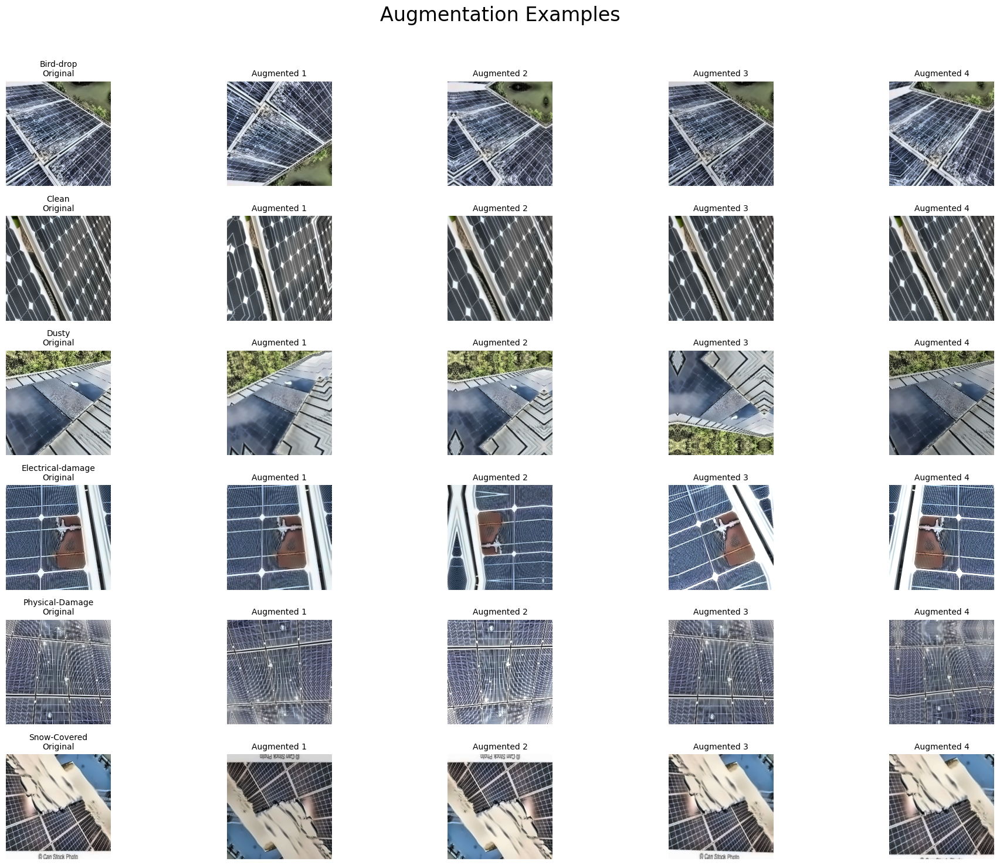

In [20]:

print("\nVisualizing augmentation examples...")
fig, axes = plt.subplots(len(classes), 5, figsize=(20, 15))
fig.suptitle('Augmentation Examples', fontsize=24)

for i, cls in enumerate(classes):
    class_train_path = os.path.join(train_dir, cls)
    image_files = get_image_files(class_train_path)
    if image_files:
        img_path = random.choice(image_files)
        original_img = cv2.imread(img_path)
        axes[i, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"{cls}\nOriginal", fontsize=10)
        axes[i, 0].axis('off')
        for j in range(1, 5):
            aug_img = original_img.copy()
            for func in random.sample(augmentations, random.randint(1, 2)): aug_img = func(aug_img)
            axes[i, j].imshow(cv2.cvtColor(aug_img, cv2.COLOR_BGR2RGB))
            axes[i, j].set_title(f"Augmented {j}", fontsize=10)
            axes[i, j].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### --- Final count verification ---

In [21]:

print("\n--- Final Augmented Training Set Counts ---")
total_aug_images = 0
for cls in classes:
    count = len(get_image_files(os.path.join(aug_train_dir, cls)))
    print(f"- {cls}: {count} images")
    total_aug_images += count
print(f"Total augmented training images: {total_aug_images}")

print(f"\nData preparation is complete. Augmented training data is in '{aug_train_dir}'.")


--- Final Augmented Training Set Counts ---
- Bird-drop: 1000 images
- Clean: 1000 images
- Dusty: 1000 images
- Electrical-damage: 1000 images
- Physical-Damage: 1000 images
- Snow-Covered: 1000 images
Total augmented training images: 6000

Data preparation is complete. Augmented training data is in '/kaggle/working/train_augmented'.


# PHASE 2 - CUSTOM CNN MODEL TRAINING & EVALUATION

This phase uses **only a simple custom CNN trained from scratch**. No transfer-learning CNN architectures, pretrained models, transformers, attention modules, or cross-validation are used.

In [22]:
# 1. IMPORTS
import os
import time
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix
from PIL import Image

print("PyTorch version:", torch.__version__)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)


PyTorch version: 2.6.0+cu124
Device: cuda


## 2. CONFIGURATION

The existing paths are kept **exactly unchanged**.

In [23]:
# Existing paths - DO NOT CHANGE
AUG_TRAIN_DIR = "/kaggle/working/train_augmented"
VAL_DIR = "/kaggle/working/solar_panel_split/val"
TEST_DIR = "/kaggle/working/solar_panel_split/test"
MODEL_SAVE_PATH = "/kaggle/working/models/best_custom_cnn.pth"

# Training parameters
NUM_CLASSES = 6
BATCH_SIZE = 32
NUM_EPOCHS = 40
PATIENCE = 5
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-4

os.makedirs("/kaggle/working/models", exist_ok=True)


## 3. DATA LOADING

The same 224×224 input size and normalization are used for the Custom CNN.

In [24]:
data_transforms = {
    "train": transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ]),
    "val": transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
}

train_dataset = datasets.ImageFolder(
    root=AUG_TRAIN_DIR, transform=data_transforms["train"]
)
val_dataset = datasets.ImageFolder(
    root=VAL_DIR, transform=data_transforms["val"]
)
test_dataset = datasets.ImageFolder(
    root=TEST_DIR, transform=data_transforms["val"]
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

CLASS_NAMES = train_dataset.classes

print("Classes:", CLASS_NAMES)
print(f"Training samples:   {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Testing samples:    {len(test_dataset)}")


Classes: ['Bird-drop', 'Clean', 'Dusty', 'Electrical-damage', 'Physical-Damage', 'Snow-Covered']
Training samples:   6000
Validation samples: 78
Testing samples:    84


## 4. CUSTOM CNN ARCHITECTURE

A straightforward CNN is built from scratch using convolution, ReLU, batch normalization, max-pooling, and fully connected layers.

In [25]:
class CustomCNN(nn.Module):
    def __init__(self, num_classes=6):
        super(CustomCNN, self).__init__()

        self.features = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(32),
            nn.MaxPool2d(2),

            # Block 2
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(64),
            nn.MaxPool2d(2),

            # Block 3
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(128),
            nn.MaxPool2d(2),

            # Block 4
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(256),
            nn.MaxPool2d(2)
        )

        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))

        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(256 * 7 * 7, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(1024, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        return self.classifier(x)

model = CustomCNN(num_classes=NUM_CLASSES).to(DEVICE)
print(model)


CustomCNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): BatchNorm2d(256

## 5. TRAINING THE CUSTOM CNN

The model is trained only on the augmented training set. Validation loss is used for learning-rate scheduling and early stopping, and the best validation-loss model is saved to the existing path.

In [26]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)
scheduler = ReduceLROnPlateau(
    optimizer, mode="min", factor=0.2, patience=3
)

history = {
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": []
}

best_val_loss = float("inf")
patience_counter = 0
train_start_time = time.time()

for epoch in range(NUM_EPOCHS):
    # ---------------- TRAINING ----------------
    model.train()
    running_loss = 0.0
    train_correct = 0
    train_total = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        train_correct += (outputs.argmax(1) == labels).sum().item()
        train_total += labels.size(0)

    train_loss = running_loss / len(train_dataset)
    train_acc = train_correct / train_total

    # ---------------- VALIDATION ----------------
    model.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            val_running_loss += loss.item() * inputs.size(0)
            val_correct += (outputs.argmax(1) == labels).sum().item()
            val_total += labels.size(0)

    val_loss = val_running_loss / len(val_dataset)
    val_acc = val_correct / val_total

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["train_acc"].append(train_acc)
    history["val_acc"].append(val_acc)

    scheduler.step(val_loss)

    print(
        f"Epoch {epoch+1:02d}/{NUM_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
        f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}"
    )

    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), MODEL_SAVE_PATH)
    else:
        patience_counter += 1
        if patience_counter >= PATIENCE:
            print("Early stopping triggered.")
            break

train_time = time.time() - train_start_time
print(f"\nTraining completed in {train_time:.2f} seconds.")
print(f"Best model saved at: {MODEL_SAVE_PATH}")


Epoch 01/40 | Train Loss: 0.8606 | Train Acc: 0.6885 | Val Loss: 1.1021 | Val Acc: 0.6923
Epoch 02/40 | Train Loss: 0.4205 | Train Acc: 0.8587 | Val Loss: 1.1148 | Val Acc: 0.7051
Epoch 03/40 | Train Loss: 0.2598 | Train Acc: 0.9133 | Val Loss: 1.1965 | Val Acc: 0.7436
Epoch 04/40 | Train Loss: 0.1731 | Train Acc: 0.9412 | Val Loss: 1.2180 | Val Acc: 0.7564
Epoch 05/40 | Train Loss: 0.1177 | Train Acc: 0.9613 | Val Loss: 1.2680 | Val Acc: 0.7821
Epoch 06/40 | Train Loss: 0.0593 | Train Acc: 0.9862 | Val Loss: 1.1229 | Val Acc: 0.8077
Early stopping triggered.

Training completed in 97.45 seconds.
Best model saved at: /kaggle/working/models/best_custom_cnn.pth


## 6. TRAINING & VALIDATION LOSS AND ACCURACY

These curves show the Custom CNN learning behavior across epochs.

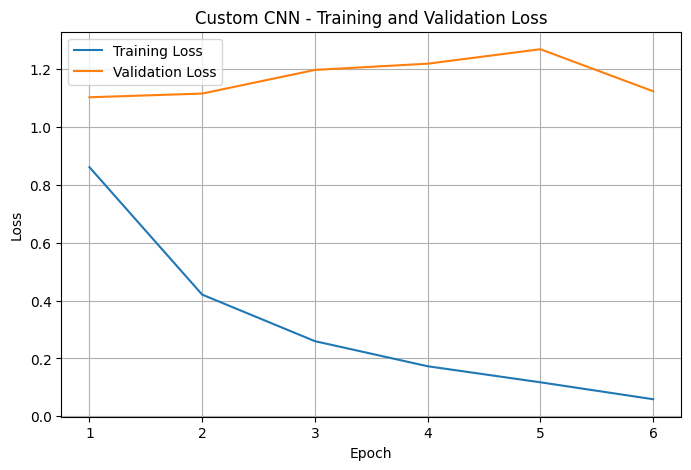

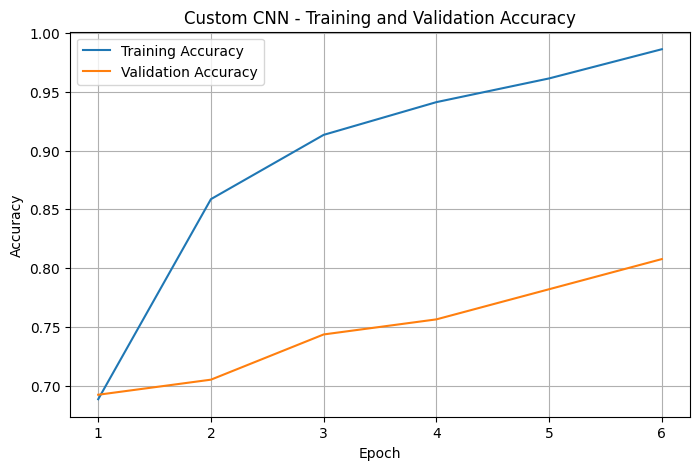

In [27]:
epochs_ran = range(1, len(history["train_loss"]) + 1)

plt.figure(figsize=(8, 5))
plt.plot(epochs_ran, history["train_loss"], label="Training Loss")
plt.plot(epochs_ran, history["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Custom CNN - Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(epochs_ran, history["train_acc"], label="Training Accuracy")
plt.plot(epochs_ran, history["val_acc"], label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Custom CNN - Training and Validation Accuracy")
plt.legend()
plt.grid(True)
plt.show()


## 7. CONFUSION MATRIX FUNCTION

In [28]:
def get_predictions(model, loader):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs = inputs.to(DEVICE)
            outputs = model(inputs)
            preds = outputs.argmax(1)

            all_labels.extend(labels.numpy())
            all_preds.extend(preds.cpu().numpy())

    return np.array(all_labels), np.array(all_preds)


def show_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(9, 7))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=CLASS_NAMES,
        yticklabels=CLASS_NAMES
    )
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(title)
    plt.tight_layout()
    plt.show()

    return cm


## 8. TRAINING CONFUSION MATRIX

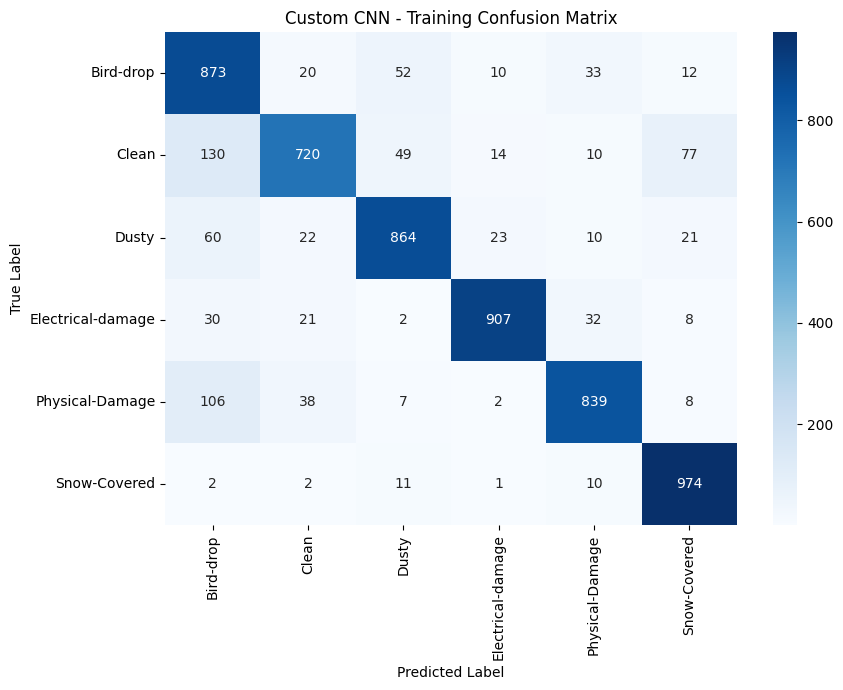

Training Classification Report:
                   precision    recall  f1-score   support

        Bird-drop     0.7269    0.8730    0.7933      1000
            Clean     0.8748    0.7200    0.7899      1000
            Dusty     0.8772    0.8640    0.8705      1000
Electrical-damage     0.9478    0.9070    0.9269      1000
  Physical-Damage     0.8983    0.8390    0.8676      1000
     Snow-Covered     0.8855    0.9740    0.9276      1000

         accuracy                         0.8628      6000
        macro avg     0.8684    0.8628    0.8626      6000
     weighted avg     0.8684    0.8628    0.8626      6000



In [29]:
# Load the best Custom CNN before final evaluation
model.load_state_dict(torch.load(MODEL_SAVE_PATH, map_location=DEVICE))

train_true, train_pred = get_predictions(model, train_loader)

show_confusion_matrix(
    train_true,
    train_pred,
    "Custom CNN - Training Confusion Matrix"
)

print("Training Classification Report:")
print(classification_report(
    train_true, train_pred,
    target_names=CLASS_NAMES,
    digits=4,
    zero_division=0
))


## 9. VALIDATION CONFUSION MATRIX

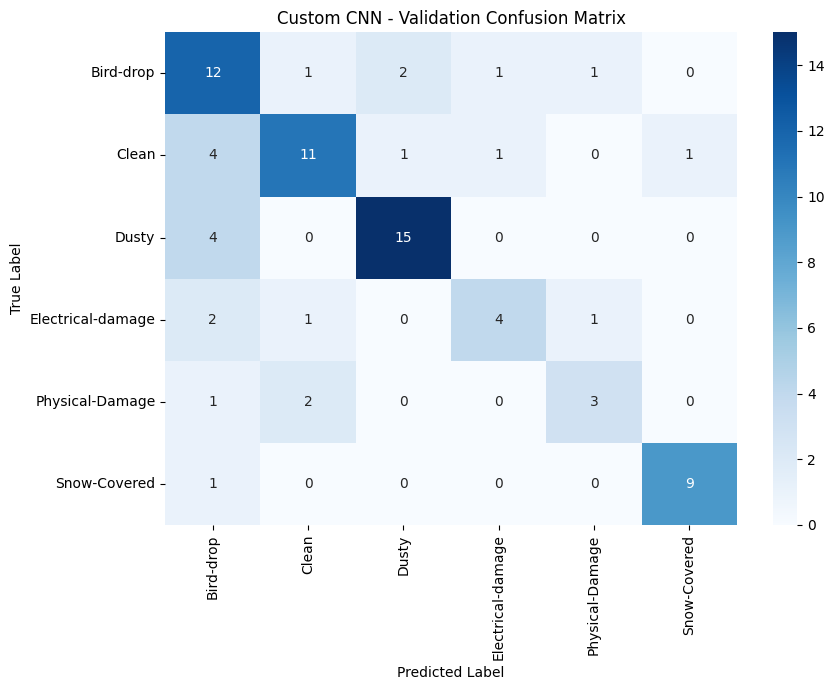

Validation Classification Report:
                   precision    recall  f1-score   support

        Bird-drop     0.5000    0.7059    0.5854        17
            Clean     0.7333    0.6111    0.6667        18
            Dusty     0.8333    0.7895    0.8108        19
Electrical-damage     0.6667    0.5000    0.5714         8
  Physical-Damage     0.6000    0.5000    0.5455         6
     Snow-Covered     0.9000    0.9000    0.9000        10

         accuracy                         0.6923        78
        macro avg     0.7056    0.6677    0.6800        78
     weighted avg     0.7111    0.6923    0.6949        78



In [30]:
val_true, val_pred = get_predictions(model, val_loader)

show_confusion_matrix(
    val_true,
    val_pred,
    "Custom CNN - Validation Confusion Matrix"
)

print("Validation Classification Report:")
print(classification_report(
    val_true, val_pred,
    target_names=CLASS_NAMES,
    digits=4,
    zero_division=0
))


## 10. TESTING CONFUSION MATRIX AND FINAL RESULTS

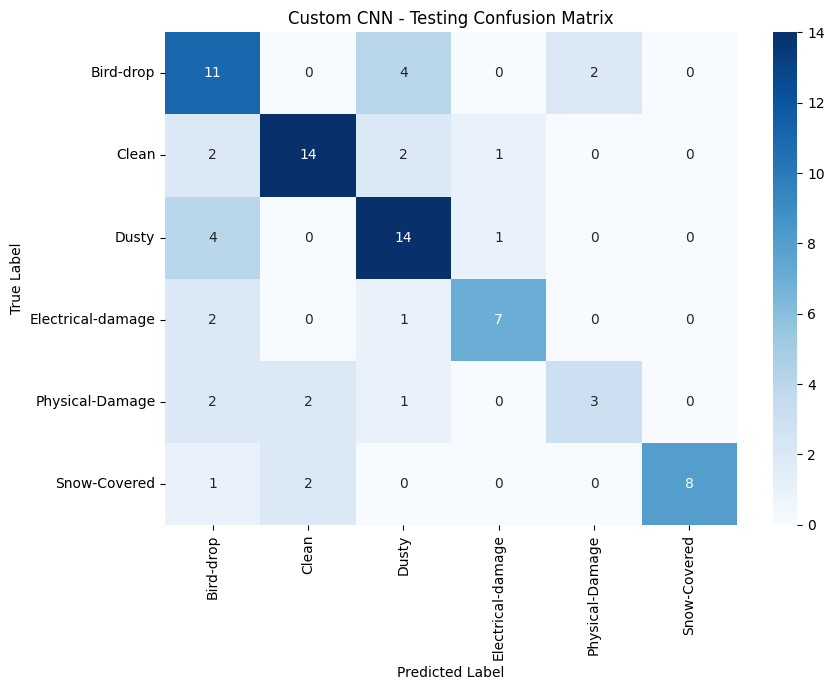

Testing Classification Report:
                   precision    recall  f1-score   support

        Bird-drop     0.5000    0.6471    0.5641        17
            Clean     0.7778    0.7368    0.7568        19
            Dusty     0.6364    0.7368    0.6829        19
Electrical-damage     0.7778    0.7000    0.7368        10
  Physical-Damage     0.6000    0.3750    0.4615         8
     Snow-Covered     1.0000    0.7273    0.8421        11

         accuracy                         0.6786        84
        macro avg     0.7153    0.6538    0.6740        84
     weighted avg     0.7017    0.6786    0.6818        84


--- Final Custom CNN Results ---
Test Accuracy: 0.6786
Test Inference Time: 0.25 seconds
Best Validation Loss: 1.1021


In [31]:
test_start_time = time.time()
test_true, test_pred = get_predictions(model, test_loader)
test_inference_time = time.time() - test_start_time

test_accuracy = (test_true == test_pred).mean()

show_confusion_matrix(
    test_true,
    test_pred,
    "Custom CNN - Testing Confusion Matrix"
)

print("Testing Classification Report:")
print(classification_report(
    test_true, test_pred,
    target_names=CLASS_NAMES,
    digits=4,
    zero_division=0
))

print("\n--- Final Custom CNN Results ---")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Inference Time: {test_inference_time:.2f} seconds")
print(f"Best Validation Loss: {best_val_loss:.4f}")


## 11. PREDICT A RANDOM TEST IMAGE

This cell selects one random image from the existing test-set path and predicts its class using the trained Custom CNN.

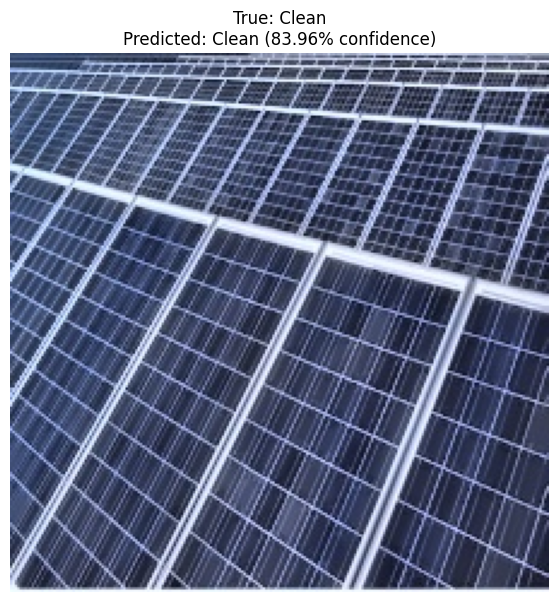

Random image path: /kaggle/working/solar_panel_split/test/Clean/Clean (2).jpg
True class: Clean
Predicted class: Clean
Confidence: 83.96%


In [65]:
# Select a random image from the existing test directory
random_class = random.choice(CLASS_NAMES)
class_dir = os.path.join(TEST_DIR, random_class)
image_files = [
    os.path.join(class_dir, f)
    for f in os.listdir(class_dir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

random_image_path = random.choice(image_files)

# Preprocess the image in the same way as validation/test data
image = Image.open(random_image_path).convert("RGB")
input_tensor = data_transforms["val"](image).unsqueeze(0).to(DEVICE)

model.eval()
with torch.no_grad():
    output = model(input_tensor)
    probabilities = torch.softmax(output, dim=1)
    predicted_index = output.argmax(1).item()
    confidence = probabilities[0, predicted_index].item()

predicted_class = CLASS_NAMES[predicted_index]
true_class = random_class

plt.figure(figsize=(7, 7))
plt.imshow(image)
plt.axis("off")
plt.title(
    f"True: {true_class}\n"
    f"Predicted: {predicted_class} ({confidence*100:.2f}% confidence)"
)
plt.show()

print("Random image path:", random_image_path)
print("True class:", true_class)
print("Predicted class:", predicted_class)
print(f"Confidence: {confidence*100:.2f}%")


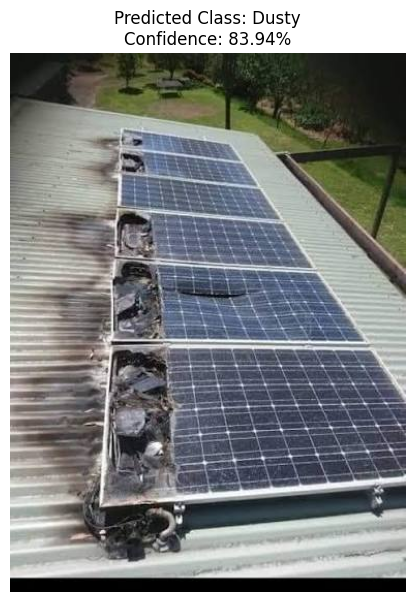

CUSTOM IMAGE PREDICTION
Image path: /kaggle/input/datasets/muhammadhassan82/some-test-images/images.jpg
Predicted class: Dusty
Confidence: 83.94%


In [74]:
# ============================================================
# FINAL CELL: PREDICT YOUR OWN IMAGE
# ============================================================

# Put your own Kaggle image path here
custom_image_path = "/kaggle/input/datasets/muhammadhassan82/some-test-images/images.jpg"
# Load image
image = Image.open(custom_image_path).convert("RGB")

# Use the SAME preprocessing as validation/test data
input_tensor = data_transforms["val"](image).unsqueeze(0).to(DEVICE)

# Make prediction
model.eval()

with torch.no_grad():
    output = model(input_tensor)
    probabilities = torch.softmax(output, dim=1)

    predicted_index = output.argmax(1).item()
    confidence = probabilities[0, predicted_index].item()

# Get predicted class
predicted_class = CLASS_NAMES[predicted_index]

# Display image and prediction
plt.figure(figsize=(7, 7))
plt.imshow(image)
plt.axis("off")
plt.title(
    f"Predicted Class: {predicted_class}\n"
    f"Confidence: {confidence * 100:.2f}%"
)
plt.show()

# Print result
print("=" * 60)
print("CUSTOM IMAGE PREDICTION")
print("=" * 60)
print("Image path:", custom_image_path)
print("Predicted class:", predicted_class)
print(f"Confidence: {confidence * 100:.2f}%")
print("=" * 60)